In [1]:
import numpy as np
import cv2 as cv
import os, sys, glob
import matplotlib.pyplot as plt
from scipy import signal
from scipy import fftpack

In [11]:
"""
count = 1
#pathTest = '/Users/estepark/Documents/week1_thurs/GRR_Sample/Vermouth_EVT/20181126/Images/Reg/White/*.Png'
pathTest = '/Users/estepark/Documents/week1_thurs/GRR_Sample/Vermouth_EVT/20181126/Images/Reg/White'
isdir = os.path.isdir(pathTest) 
"""
class CrossHatch(object):
    """
    FUNCTION: 
    ** generate plots and pass/fail outputs based on frequency vs. distance 
    INPUTS: 
    ** path: the path that contains all the images
    ** rows: the number of rows to iterate thru
    ** col: the number of columns to iterate thru
    ?* filterType: crossHatch, faintLine, edgeGlow, luminanceHotspot, colorHotspot
    OUTPUTS:
    ** dict key: what # the image is in the dir
    ** dict values:  
    """
    def __init__(self, path , rows, col):
        assert os.path.isdir(pathTest), "gey"
        self.path = path
        self.rows = rows
        self.col = col
    def createDict(self):
        # define scharr kernal to convolve along diagonals
        kern = [[0, 1,  0], [1, 0, -1],[ 0, -1 ,0]]
        # define counter to number how many images in the dir
        count = 1
        white = {}
        img = [] # 1st value in dictionary
        imgScharr = [] # 2nd value in dictionary
        print("Image directory: " + str(self.path))
        print("Number of rows: " + str(self.rows))
        print("Number of col: " + str(self.col))
        for fname in glob.glob(self.path+'/*.Png'):
            #print(fname)
            img.append(cv.imread(fname))
            plt.figure()
            plt.title('White Image ' + str(count) + ": flipped from RGB --> BGR")
            plt.imshow(img[-1])
            #==============================================================
            # 1st VALUE, original pixel BGR mat 
            #==============================================================
            im = img.copy()
            imgray = cv.cvtColor(im[-1], cv.COLOR_BGR2GRAY)
            #print(imgray)
            #==============================================================
            # 2nd VALUE, Scharr pixel mat
            #==============================================================
            imgray = cv.bilateralFilter(imgray, 15, 75, 75)
            ret, thresh = cv.threshold(imgray, 10, 255, cv.THRESH_BINARY)
            contours, hierarchy = cv.findContours(thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
            im_with_contours = cv.drawContours(im[-1], contours, -1, (0,255,0), 6)
            diag_img = signal.convolve2d(imgray, np.array(kern), boundary='symm', mode='same')
            imgScharr.append(diag_img)
            plt.figure()
            plt.title('White Image ' + str(count) + ": Scharr operator + Low pass filter")
            #plt.imshow(diag_img+101, cmap="gray")
            plt.imshow(diag_img , cmap="gray")
            plt.show()
            #================================================================
            # 3rd VALUE, intensity vs. pixel 1D array with 3 basis vectors 
            #================================================================
            samplingFreq = 100
            samplingInterval = 1 / samplingFreq
            beginTime = 0
            endTime = self.col
            teim = np.arange(beginTime,endTime, 1)
            
            for i in range(self.col):
                figure , axis = plt.subplots(3,1)
                plt.subplots_adjust ( hspace = 1)
                # the issue is x-axis png ranges from 481, y-axis ranges 660
                amplitude = imgray[:,i]
                
                #amplitude = amplitude[0: self.col] # slice it to match the # of col window
                #print("shape of amp" +  str(amplitude.shape))
                # time domain representation for CrossHatch periodic signal
                axis[0].set_title('Col # %s' % (i) + " Intensity vs. Pixel distance " )
                axis[0].set_xlabel('Pixel Distance along y-axis ')
                axis[0].set_ylabel('Pixel intensity')
                axis[0].plot(amplitude)
                
                plt.subplots_adjust ( hspace = 1)
                # frequency domain representation
                fourierTransf = np.fft.fft(amplitude)/ len(amplitude) # normalize amplitude
                fourierTransf = fourierTransf[range(int(len(amplitude)/2))] #exclude sampling freq
                tpCount = len(amplitude)
                val = np.arange(int(tpCount/2))
                timePer = tpCount/samplingFreq
                freq = val/timePer 
                axis[1].set_title('Col # %s' % (i) + " FFT Intensity vs. Pixel distance " +str(count))
                axis[1].set_xlabel('Pixel Distance along y-axis ')
                axis[1].set_ylabel('Pixel intensity spectrum')
                axis[1].plot(freq, abs(fourierTransf))
                
                plt.subplots_adjust ( hspace = 2)
                axis[2].set_title('Col # %s' % (i) + " FFT Intensity vs. Pixel distance " +str(count))
                axis[2].set_xlabel('Pixel Distance along y-axis ')
                axis[2].set_ylabel('Frequency domainspectrum')
                axis[2].set_xlim(-samplingFreq / 2, samplingFreq / 2)
                axis[2].set_ylim(-5, 110)
                axis[2].stem(freq, np.abs(fourierTransf))
                
                plt.subplots_adjust ( hspace = 2)
                frequen = np.linspace(0,self.rows, self.rows)
                X = fftpack.fft(amplitude)
                amplitude1 = fftpack.fftfreq(len(amplitude))*samplingFreq
                axis[2].set_title('Col # %s' % (i) + " FFT Intensity vs. Pixel distance " +str(count))
                axis[2].set_xlabel('Pixel Distance along y-axis ')
                axis[2].set_ylabel('Frequency domainspectrum')
                axis[2].set_xlim(-samplingFreq / 2, samplingFreq / 2)
                axis[2].set_ylim(-5, 500)
                axis[2].stem(frequen, np.abs(X), use_line_collection = True)
                
                
                
            #================================================================
            # 4th VALUE, FFT stuff 
            #================================================================
            print(count)
            
            white.update( { 'white %s' % (count): (img[count-1]  , imgScharr[count-1]) } )

            count = count +1

Image directory: /Users/estepark/Documents/week1_thurs/GRR_Sample/Vermouth_EVT/20181126/Images/Reg/White
Number of rows: 646
Number of col: 480


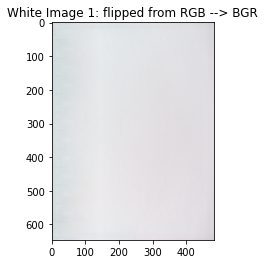

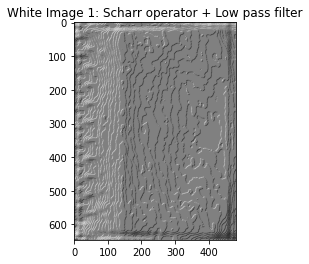

/Users/estepark/Library/Python/3.7/lib/python/site-packages/ipykernel_launcher.py:104: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
/Users/estepark/Library/Python/3.7/lib/python/site-packages/ipykernel_launcher.py:104: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
/Users/estepark/Library/Python/3.7/lib/python/site-packages/ipykernel_launcher.py:104: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantl

1


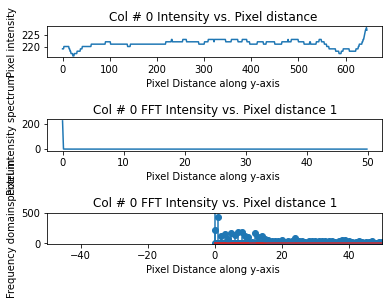

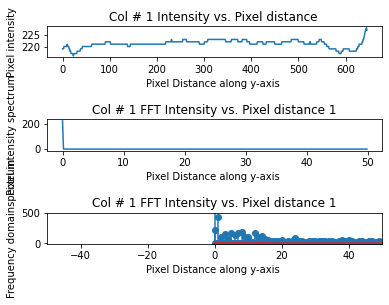

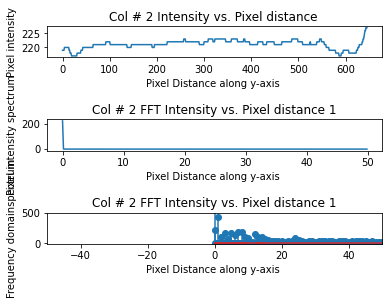

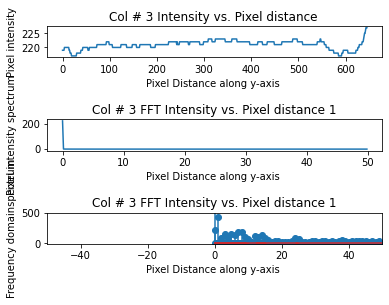

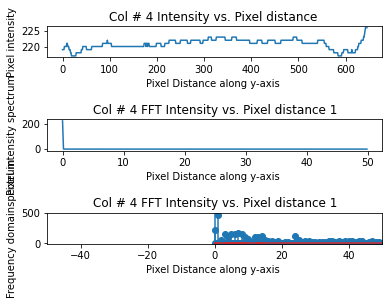

...

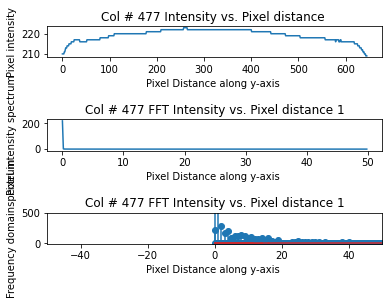

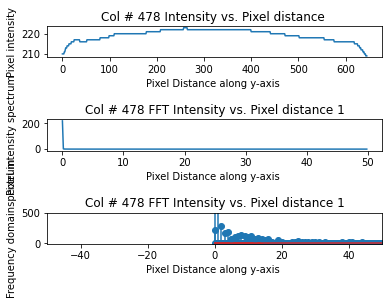

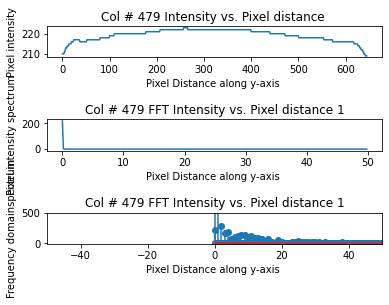

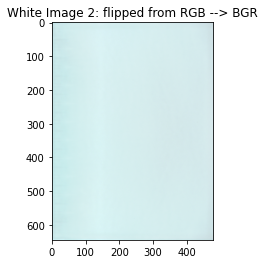

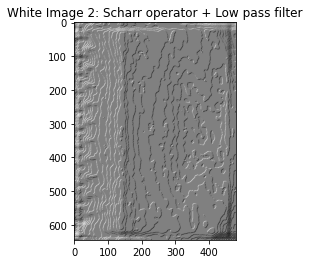

/Users/estepark/Library/Python/3.7/lib/python/site-packages/ipykernel_launcher.py:104: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


ValueError: x and y must have same first dimension, but have shapes (646,) and (645,)

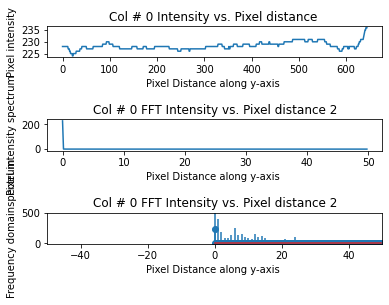

In [12]:
pathTest = '/Users/estepark/Documents/week1_thurs/GRR_Sample/Vermouth_EVT/20181126/Images/Reg/White'
isdir = os.path.isdir(pathTest) 

stuff = CrossHatch(path = pathTest, rows=  646, col= 480)
stuff.createDict()

In [ ]:
len(img)
count = 1
"""
objective: 
1) iterate through every 600 columns, find greatest variation in peaks

2) rank the greatest peak variations
"""
White = {}
for i in range(10):
    #print(count)
    White.update( { 'white %s' % (count): (img[i]  , imgScharr[i]) } )
    count = count +1 
    #print(White)

(array([2, 6]), {'peak_heights': array([150., 150.])})


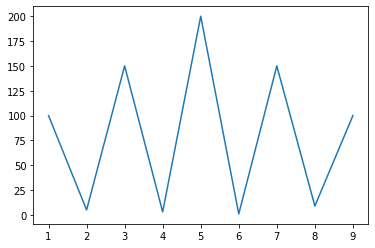

In [24]:
import scipy
amplitude1 = [100,5,150,3,200,1,150,9,100] 
time = [1,2,3,4,5,6,7,8,9]
plt.plot(time,amplitude1)
a=scipy.signal.find_peaks(amplitude1,height=[125,175],distance = 1  )
print(a)

In [ ]:
height = [0,500] , distance = 